In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

In [10]:
wavelength = 0.635 #in um
groovewidth = 9.95 #in um
groovespacing = 27.36 #in um .....27.36
beamwidth = 25000 #in um. 2000um = 2mm
inputangle = 0 #in degrees
inputangle = inputangle*np.pi/180 #in rad
blazeangle = 71.56 #in degrees
blazeangle = blazeangle*np.pi/180 #in rad

outputangle_deg = np.linspace(-90,90,50000)
outputangle_rad = outputangle_deg*np.pi/180


In [11]:
###Start by setting up array of all orders m
m_vector = np.arange(-70, 70, 1)
# m_vector.shape

###Now, calulate the diffraction angle for each order
diffraction_centers = np.arcsin(np.sin(inputangle)+(m_vector*wavelength/groovespacing))

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in arcsin
  


In [12]:
###Make a mask to get rid of NaNs aka where the grating no longer reflects orders at the far wings
mask = np.isfinite(diffraction_centers)

###Apply mask to orders array and corresponding diffracted angle array:
m_vector = m_vector[mask]
diffraction_centers = diffraction_centers[mask]

###Broadcast diffracted angle array to a column (transpose):
diffraction_column_vector = np.expand_dims(diffraction_centers, 1)

In [13]:
#argument for beam diffraction sinc function:
argBD = (beamwidth*np.pi/wavelength)*np.sin(outputangle_rad-diffraction_column_vector)
#Sinc function then is:
BeamDiffraction = (np.sin(argBD)/argBD)**2

n_orders = len(m_vector)


//anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


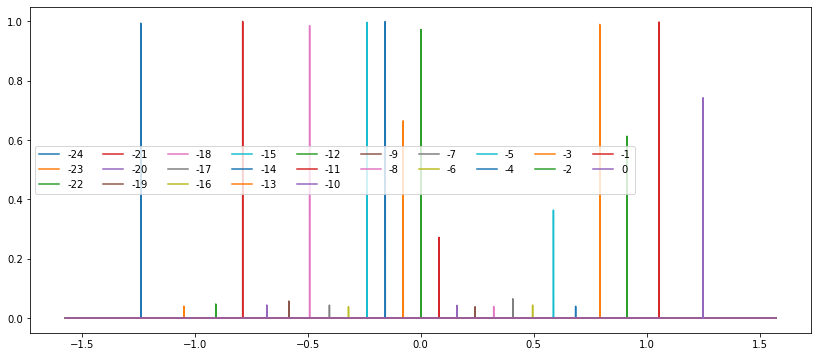

In [14]:
### Plot all the orders (the comb) in unblazed diffraction: (this cell might take a sec to run)
plt.figure(figsize=(14, 6))
for i in range(n_orders):
  plt.plot(outputangle_rad,BeamDiffraction[i, :], label=m_vector[i]);

plt.legend(ncol=10)

In [8]:
# print(len(BeamDiffraction))
# print(len(total_unblazed_diffraction))

(60, 85)

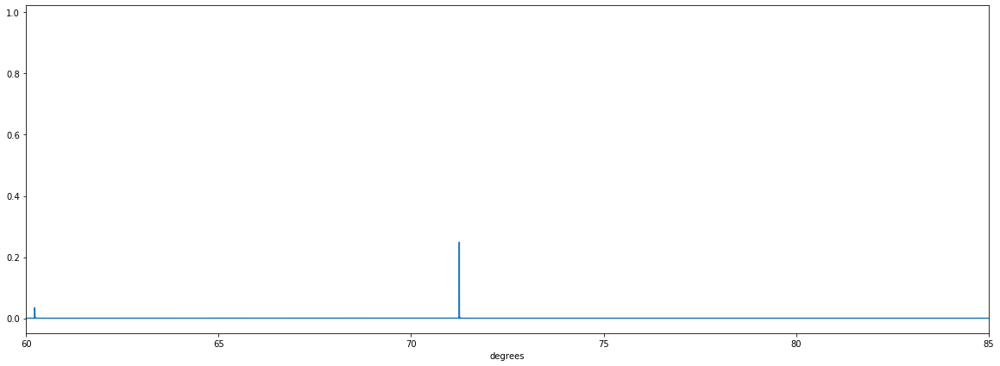

In [9]:
### Plot all the orders (the comb) in unblazed diffraction:
total_unblazed_diffraction = BeamDiffraction.sum(0) ######not sure what is happening here

plt.figure(figsize=(20, 7))
plt.plot(outputangle_rad*180/math.pi,total_unblazed_diffraction);
plt.xlabel('degrees')
#plt.title('beam diffraction for m ={}'.format(m))
# plt.xlim(0,90)
plt.xlim(60,85)

### Now add blaze and multiply comb by blaze envelope

In [10]:
#arg for blaze envelope sinc function:
argBE = (groovewidth*np.pi/wavelength)*np.sin(outputangle_rad-blazeangle)
#sinc function to describe the blaze envelope:
BlazeEnvelope = (np.sin(argBE)/argBE)**2

In [11]:
total_blazed_diffraction = total_unblazed_diffraction * BlazeEnvelope

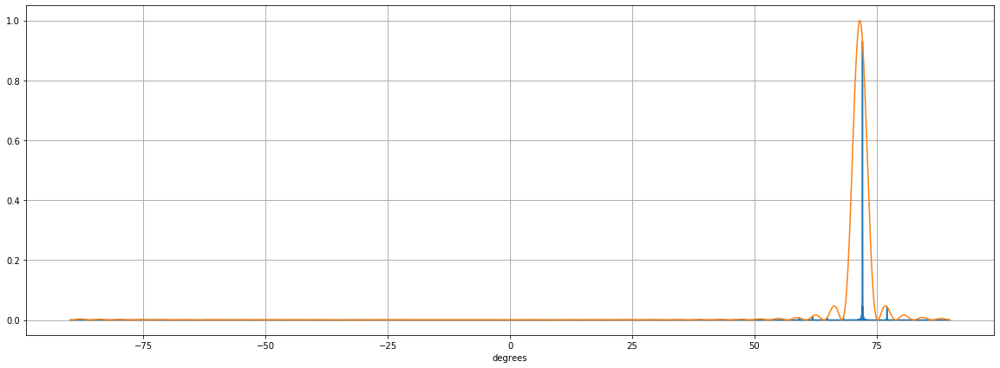

In [12]:
plt.figure(figsize=(20, 7))
plt.plot(outputangle_rad*180/math.pi,total_blazed_diffraction);
plt.plot(outputangle_rad*180/math.pi,BlazeEnvelope);
plt.xlabel('degrees')
plt.grid(linestyle='-', linewidth=1)

#plt.title('beam diffraction for m ={}'.format(m))
# plt.xlim(63,78)

### Plot multiple diff blaze envelopes on top of each other


In [13]:
###Blaze1
blazeangle1d = 71.5 #in degrees
blazeangle1 = blazeangle1d*np.pi/180 #in rad
#arg for blaze envelope sinc function:
argBE1 = (groovewidth*np.pi/wavelength)*np.sin(outputangle_rad-blazeangle1)
#sinc function to describe the blaze envelope:
BlazeEnvelope1 = (np.sin(argBE1)/argBE1)**2

###Blaze2
blazeangle2d = 71.6 #in degrees
blazeangle2 = blazeangle2d*np.pi/180 #in rad
#arg for blaze envelope sinc function:
argBE2 = (groovewidth*np.pi/wavelength)*np.sin(outputangle_rad-blazeangle2)
#sinc function to describe the blaze envelope:
BlazeEnvelope2 = (np.sin(argBE2)/argBE2)**2

total_blazed_diffraction2 = total_unblazed_diffraction * BlazeEnvelope2
total_blazed_diffraction1 = total_unblazed_diffraction * BlazeEnvelope1

Text(77, 0.6, 'm+1')

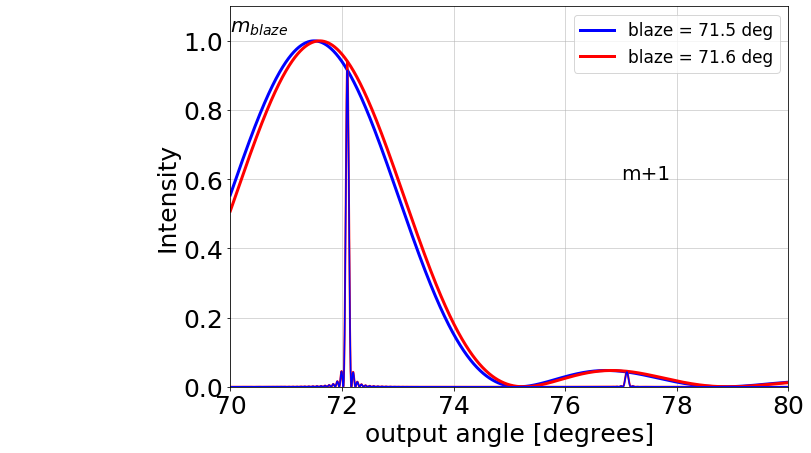

In [14]:
blazze = 'blaze'
########################################### Enable in notebook zooming:
%matplotlib inline
import mpld3
mpld3.enable_notebook()
###########################################

plt.figure(figsize=(10, 7))
# plt.plot(outputangle_rad*180/math.pi,total_blazed_diffraction);
plt.plot(outputangle_rad*180/math.pi,BlazeEnvelope1,label ='blaze = {} deg'.format(blazeangle1d), color = 'b',linewidth =3);
plt.plot(outputangle_rad*180/math.pi,BlazeEnvelope2, label ='blaze = {} deg'.format(blazeangle2d),color = 'r',linewidth =3);
plt.plot(outputangle_rad*180/math.pi,total_blazed_diffraction2,color = 'r',linewidth =2);
plt.plot(outputangle_rad*180/math.pi,total_blazed_diffraction1,color = 'b');
plt.xlabel('output angle [degrees]',fontsize = 25)
plt.ylabel('Intensity',fontsize = 25)
plt.grid(linestyle='-', linewidth=0.5)
# plt.xlim(53,90)
plt.xlim(70,80)
plt.ylim(0,1.1)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.legend(loc='upper right',fontsize = 17)
plt.annotate('$m_{{{}}}$'.format(blazze), xy=(70,1.025), xycoords='data', fontsize=20)
plt.annotate('m-1', xy=(66,0.9), xycoords='data', fontsize=20)
# plt.annotate('m-2', xy=(62.5,0.47), xycoords='data', fontsize=20)
plt.annotate('m+1', xy=(77,0.6), xycoords='data', fontsize=20)

# i = 3
# plt.annotate('$q_{}={}$'.format(i))#,(loc_x[i]+2, loc_y[i]))


### NOTES

Effects the blaze envelope:
- wider groove width --> more pressed and narrow blaze envelope 
- smaller groove width --> wider blaze envelope

Effects the orders comb:
- wider groove spacing (less grooves per mm) -->  less spread out orders (less spare and more dense comb)
- smaller groove spacing (more grooves per mm) --> more spread out orders (more sparse comb)
- wider beam puts orders farther appart; orders will be more well defined
- narrower input beam squishes orders closer together, below ~300um beam, airy discs will start to constructively interfere and bump each other up